#  Introduction
### Dataset Description
**train.csv**
tarih = Date the outage occurred <br />
ilce = The city-district where the outage occurred. Example: “manisa-akhisar” <br />
bildirimli_sum = Number of planned outages <br />
bildirimsiz_sum = Number of unplanned outages (Target variable to predict 🎯) <br />


**test.csv**
tarih = Date the outage occurred <br />
ilce = The city-district where the outage occurred. Example: “manisa-akhisar” <br />
bildirimli_sum = Number of planned outages <br />


**weather.csv**
date <br />
lat = Latitude <br />
lon = Longitude <br />
t_2m:C — Temperature, Celsius <br />
effective_cloud_cover:p — Cloudiness <br />
global_rad:W — Sunshine value, Watts <br />
relative_humidity_2m:p — Relative humidity <br />
wind_dir_10m:d — Wind direction <br />
wind_speed_10m:ms — Wind speed, m/s <br />
prob_precip_1h:p — Precipitation<br />
t_apparent:C — Sensible temperature<br />
ilce — Province-District duo. Example: “manisa-akhisar”<br />


**holidays.csv**

Yıl = Year<br />
Ay = Month<br />
Gün = Day<br />
Bayram_Flag — Holiday name<br />

**Gediz is a electric company and  Id like predict number of unplanned outage.**




#  Importing Libraries and loading dataset


In [31]:
import pandas as pd      
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from pycaret.regression import *
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport

plt.rcParams["figure.figsize"] = (10,6)   # default: (6.4, 4.8)
pd.set_option('display.max_columns', 500) # None: sınırsız, default:20
pd.set_option('display.max_rows', 500)    # None: sınırsız, default:10
pd.options.display.float_format = '{:.3f}'.format

In [2]:
holidays = pd.read_csv("G:\\My Drive\\Kaggle\\Gediz\\holidays.csv")
df = pd.read_csv("G:\\My Drive\\Kaggle\\Gediz\\train.csv")
weather = pd.read_csv("G:\\My Drive\\Kaggle\\Gediz\\weather.csv")
#test = pd.read_csv("G:\\My Drive\\Kaggle\\Gediz\\test.csv")

#  Exploratory Data Analysis (EDA)

Statistical Summary: With describe() to get a statistical overview of the dataset.<br />
Univariate Analysis: Analyze the distribution of key variables using histograms or box plots.<br />
Bivariate Analysis: Explore relationships between variables using scatter plots, bar charts, or groupby statements.<br />
Correlation Analysis: With heatmaps to identify potential correlations between variables.


In [8]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
df

,tarih,ilce,bildirimsiz_sum,bildirimli_sum
0,2021-01-01,izmir-aliaga,5,0
1,2021-01-02,izmir-aliaga,13,0
2,2021-01-03,izmir-aliaga,4,0
3,2021-01-04,izmir-aliaga,9,0
4,2021-01-05,izmir-aliaga,2,0
...,...,...,...,...
48143,2024-01-23,manisa-ahmetli,1,0
48144,2024-01-24,manisa-ahmetli,2,0
48145,2024-01-25,manisa-ahmetli,2,0
48146,2024-01-26,manisa-ahmetli,2,0


In [10]:
weather 

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,name
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,Manisa-Ahmetli
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,Manisa-Ahmetli
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,Manisa-Ahmetli
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,Manisa-Ahmetli
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,Manisa-Ahmetli
...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,Izmir-Odemis
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,Izmir-Odemis
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,Izmir-Odemis
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,Izmir-Odemis


In [11]:
holidays

,Yıl,Ay,Gün,Tatil Adı
0,2021,1,1,New Year's Day
1,2021,4,23,National Sovereignty and Children's Day
2,2021,5,1,Labour Day
3,2021,5,19,"Commemoration of Ataturk, Youth and Sports Day"
4,2021,7,15,Democracy and National Unity Day
5,2021,8,30,Victory Day
6,2021,10,29,Republic Day
7,2021,5,13,Ramadan Feast* (*estimated)
8,2021,5,14,Ramadan Feast Holiday* (*estimated)
9,2021,5,15,Ramadan Feast Holiday* (*estimated)


In [3]:
# df.rename(columns={"A": "a", "B": "c"})
weather = weather.rename(columns={"name": "ilce"})
weather

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,Manisa-Ahmetli
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,Manisa-Ahmetli
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,Manisa-Ahmetli
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,Manisa-Ahmetli
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,Manisa-Ahmetli
...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,Izmir-Odemis
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,Izmir-Odemis
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,Izmir-Odemis
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,Izmir-Odemis


In [4]:
df['ilce'] = df['ilce'].str.lower()
weather['ilce'] = weather['ilce'].str.lower()

In [16]:
weather

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,manisa-ahmetli
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,manisa-ahmetli
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,manisa-ahmetli
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,manisa-ahmetli
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,manisa-ahmetli
...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,izmir-odemis
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,izmir-odemis
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,izmir-odemis
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,izmir-odemis


In [18]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48148 entries, 0 to 48147
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   tarih            48148 non-null  object
 1   ilce             48148 non-null  object
 2   bildirimsiz_sum  48148 non-null  int64 
 3   bildirimli_sum   48148 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 1.5+ MB


In [19]:
weather.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302840 entries, 0 to 1302839
Data columns (total 12 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   date                     1302840 non-null  object 
 1   lat                      1302840 non-null  float64
 2   lon                      1302840 non-null  float64
 3   t_2m:C                   1302840 non-null  float64
 4   effective_cloud_cover:p  1302840 non-null  float64
 5   global_rad:W             1302840 non-null  float64
 6   relative_humidity_2m:p   1302840 non-null  float64
 7   wind_dir_10m:d           1302840 non-null  float64
 8   wind_speed_10m:ms        1302840 non-null  float64
 9   prob_precip_1h:p         1302840 non-null  float64
 10  t_apparent:C             1302840 non-null  float64
 11  ilce                     1302840 non-null  object 
dtypes: float64(10), object(2)
memory usage: 119.3+ MB


In [5]:
df['tarih'] = pd.to_datetime(df['tarih'])
weather['date'] = pd.to_datetime(weather['date'])

In [21]:
weather.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302840 entries, 0 to 1302839
Data columns (total 12 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   date                     1302840 non-null  datetime64[ns]
 1   lat                      1302840 non-null  float64       
 2   lon                      1302840 non-null  float64       
 3   t_2m:C                   1302840 non-null  float64       
 4   effective_cloud_cover:p  1302840 non-null  float64       
 5   global_rad:W             1302840 non-null  float64       
 6   relative_humidity_2m:p   1302840 non-null  float64       
 7   wind_dir_10m:d           1302840 non-null  float64       
 8   wind_speed_10m:ms        1302840 non-null  float64       
 9   prob_precip_1h:p         1302840 non-null  float64       
 10  t_apparent:C             1302840 non-null  float64       
 11  ilce                     1302840 non-null  object        
dtype

In [22]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48148 entries, 0 to 48147
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   tarih            48148 non-null  datetime64[ns]
 1   ilce             48148 non-null  object        
 2   bildirimsiz_sum  48148 non-null  int64         
 3   bildirimli_sum   48148 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 1.5+ MB


In [6]:
weather['tarih'] = weather['date'].dt.date
weather

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,manisa-ahmetli,2021-01-01
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,manisa-ahmetli,2021-01-01
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,manisa-ahmetli,2021-01-01
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,manisa-ahmetli,2021-01-01
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,manisa-ahmetli,2021-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,izmir-odemis,2024-02-29
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,izmir-odemis,2024-02-29
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,izmir-odemis,2024-02-29
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,izmir-odemis,2024-02-29


In [24]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302840 entries, 0 to 1302839
Data columns (total 13 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   date                     1302840 non-null  datetime64[ns]
 1   lat                      1302840 non-null  float64       
 2   lon                      1302840 non-null  float64       
 3   t_2m:C                   1302840 non-null  float64       
 4   effective_cloud_cover:p  1302840 non-null  float64       
 5   global_rad:W             1302840 non-null  float64       
 6   relative_humidity_2m:p   1302840 non-null  float64       
 7   wind_dir_10m:d           1302840 non-null  float64       
 8   wind_speed_10m:ms        1302840 non-null  float64       
 9   prob_precip_1h:p         1302840 non-null  float64       
 10  t_apparent:C             1302840 non-null  float64       
 11  ilce                     1302840 non-null  object        
 12  

In [7]:
weather['tarih'] = pd.to_datetime(weather['tarih'])
weather

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,manisa-ahmetli,2021-01-01
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,manisa-ahmetli,2021-01-01
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,manisa-ahmetli,2021-01-01
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,manisa-ahmetli,2021-01-01
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,manisa-ahmetli,2021-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,izmir-odemis,2024-02-29
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,izmir-odemis,2024-02-29
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,izmir-odemis,2024-02-29
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,izmir-odemis,2024-02-29


In [29]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302840 entries, 0 to 1302839
Data columns (total 13 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   date                     1302840 non-null  datetime64[ns]
 1   lat                      1302840 non-null  float64       
 2   lon                      1302840 non-null  float64       
 3   t_2m:C                   1302840 non-null  float64       
 4   effective_cloud_cover:p  1302840 non-null  float64       
 5   global_rad:W             1302840 non-null  float64       
 6   relative_humidity_2m:p   1302840 non-null  float64       
 7   wind_dir_10m:d           1302840 non-null  float64       
 8   wind_speed_10m:ms        1302840 non-null  float64       
 9   prob_precip_1h:p         1302840 non-null  float64       
 10  t_apparent:C             1302840 non-null  float64       
 11  ilce                     1302840 non-null  object        
 12  

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48148 entries, 0 to 48147
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   tarih            48148 non-null  datetime64[ns]
 1   ilce             48148 non-null  object        
 2   bildirimsiz_sum  48148 non-null  int64         
 3   bildirimli_sum   48148 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 1.5+ MB


In [35]:
weather

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih
0,2021-01-01 00:00:00,38.618,28.671,7.600,10.500,0.000,86.100,173.300,2.600,1.000,5.900,manisa-ahmetli,2021-01-01
1,2021-01-01 01:00:00,38.618,28.671,7.400,6.800,0.000,88.000,174.500,2.700,1.000,5.700,manisa-ahmetli,2021-01-01
2,2021-01-01 02:00:00,38.618,28.671,7.300,4.300,0.000,90.000,177.500,2.800,1.000,5.400,manisa-ahmetli,2021-01-01
3,2021-01-01 03:00:00,38.618,28.671,7.200,8.900,0.000,90.800,175.300,2.700,1.000,5.300,manisa-ahmetli,2021-01-01
4,2021-01-01 04:00:00,38.618,28.671,8.000,22.100,0.000,89.700,172.100,2.500,1.000,6.500,manisa-ahmetli,2021-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1302835,2024-02-29 19:00:00,38.228,27.975,16.800,50.000,0.000,61.600,278.200,1.700,16.000,16.300,izmir-odemis,2024-02-29
1302836,2024-02-29 20:00:00,38.228,27.975,15.400,52.400,0.000,69.400,264.700,1.400,9.200,15.400,izmir-odemis,2024-02-29
1302837,2024-02-29 21:00:00,38.228,27.975,16.500,63.700,0.000,62.900,278.400,0.500,43.900,16.900,izmir-odemis,2024-02-29
1302838,2024-02-29 22:00:00,38.228,27.975,15.900,61.700,0.000,64.300,242.100,0.700,58.500,16.100,izmir-odemis,2024-02-29


In [34]:
df

,tarih,ilce,bildirimsiz_sum,bildirimli_sum
0,2021-01-01,izmir-aliaga,5,0
1,2021-01-02,izmir-aliaga,13,0
2,2021-01-03,izmir-aliaga,4,0
3,2021-01-04,izmir-aliaga,9,0
4,2021-01-05,izmir-aliaga,2,0
...,...,...,...,...
48143,2024-01-23,manisa-ahmetli,1,0
48144,2024-01-24,manisa-ahmetli,2,0
48145,2024-01-25,manisa-ahmetli,2,0
48146,2024-01-26,manisa-ahmetli,2,0


In [10]:
combined_df = pd.merge(weather, df, on=['tarih', 'ilce'], how='inner')
combined_df

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,0.000,67.700,134.800,2.700,1.000,8.400,manisa-ahmetli,2021-01-05,2,0
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,0.000,71.600,136.800,2.800,1.000,8.100,manisa-ahmetli,2021-01-05,2,0
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,0.000,71.300,135.500,3.100,1.000,8.000,manisa-ahmetli,2021-01-05,2,0
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,0.000,73.400,130.600,2.700,7.600,7.900,manisa-ahmetli,2021-01-05,2,0
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,0.000,68.600,138.000,3.600,12.900,8.100,manisa-ahmetli,2021-01-05,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,8.500,0.000,0.000,53.600,32.700,0.400,1.000,8.500,izmir-odemis,2024-01-31,6,2
1155548,2024-01-31 20:00:00,38.228,27.975,4.500,0.300,0.000,71.400,6.400,2.100,1.000,2.700,izmir-odemis,2024-01-31,6,2
1155549,2024-01-31 21:00:00,38.228,27.975,3.400,0.000,0.000,76.100,9.800,2.000,1.000,1.500,izmir-odemis,2024-01-31,6,2
1155550,2024-01-31 22:00:00,38.228,27.975,3.700,0.000,0.000,76.000,11.700,1.800,1.000,2.000,izmir-odemis,2024-01-31,6,2


In [11]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1155552 entries, 0 to 1155551
Data columns (total 15 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   date                     1155552 non-null  datetime64[ns]
 1   lat                      1155552 non-null  float64       
 2   lon                      1155552 non-null  float64       
 3   t_2m:C                   1155552 non-null  float64       
 4   effective_cloud_cover:p  1155552 non-null  float64       
 5   global_rad:W             1155552 non-null  float64       
 6   relative_humidity_2m:p   1155552 non-null  float64       
 7   wind_dir_10m:d           1155552 non-null  float64       
 8   wind_speed_10m:ms        1155552 non-null  float64       
 9   prob_precip_1h:p         1155552 non-null  float64       
 10  t_apparent:C             1155552 non-null  float64       
 11  ilce                     1155552 non-null  object        
 12  

In [12]:
holidays['date'] = pd.to_datetime(holidays['Yıl'].astype(str) + '-' + holidays['Ay'].astype(str) + '-' + holidays['Gün'].astype(str))
holidays

,Yıl,Ay,Gün,Tatil Adı,date
0,2021,1,1,New Year's Day,2021-01-01
1,2021,4,23,National Sovereignty and Children's Day,2021-04-23
2,2021,5,1,Labour Day,2021-05-01
3,2021,5,19,"Commemoration of Ataturk, Youth and Sports Day",2021-05-19
4,2021,7,15,Democracy and National Unity Day,2021-07-15
5,2021,8,30,Victory Day,2021-08-30
6,2021,10,29,Republic Day,2021-10-29
7,2021,5,13,Ramadan Feast* (*estimated),2021-05-13
8,2021,5,14,Ramadan Feast Holiday* (*estimated),2021-05-14
9,2021,5,15,Ramadan Feast Holiday* (*estimated),2021-05-15


In [13]:
holidays.drop(['Yıl', 'Ay', 'Gün'], axis=1, inplace=True)
holidays

,Tatil Adı,date
0,New Year's Day,2021-01-01
1,National Sovereignty and Children's Day,2021-04-23
2,Labour Day,2021-05-01
3,"Commemoration of Ataturk, Youth and Sports Day",2021-05-19
4,Democracy and National Unity Day,2021-07-15
5,Victory Day,2021-08-30
6,Republic Day,2021-10-29
7,Ramadan Feast* (*estimated),2021-05-13
8,Ramadan Feast Holiday* (*estimated),2021-05-14
9,Ramadan Feast Holiday* (*estimated),2021-05-15


In [14]:
holidays['Tatil Adı'] = 1
holidays

,Tatil Adı,date
0,1,2021-01-01
1,1,2021-04-23
2,1,2021-05-01
3,1,2021-05-19
4,1,2021-07-15
5,1,2021-08-30
6,1,2021-10-29
7,1,2021-05-13
8,1,2021-05-14
9,1,2021-05-15


In [15]:
holidays = holidays.rename(columns={"date": "tarih"})
holidays

,Tatil Adı,tarih
0,1,2021-01-01
1,1,2021-04-23
2,1,2021-05-01
3,1,2021-05-19
4,1,2021-07-15
5,1,2021-08-30
6,1,2021-10-29
7,1,2021-05-13
8,1,2021-05-14
9,1,2021-05-15


In [16]:
combined_df1 = pd.merge(combined_df, holidays, on=['tarih'], how='outer')
combined_df1

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,0.000,67.700,134.800,2.700,1.000,8.400,manisa-ahmetli,2021-01-05,2.000,0.000,NaN
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,0.000,71.600,136.800,2.800,1.000,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,NaN
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,0.000,71.300,135.500,3.100,1.000,8.000,manisa-ahmetli,2021-01-05,2.000,0.000,NaN
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,0.000,73.400,130.600,2.700,7.600,7.900,manisa-ahmetli,2021-01-05,2.000,0.000,NaN
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,0.000,68.600,138.000,3.600,12.900,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155560,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-04-12,NaN,NaN,1.000
1155561,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-06-16,NaN,NaN,1.000
1155562,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-06-17,NaN,NaN,1.000
1155563,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-06-18,NaN,NaN,1.000


In [17]:
combined_df1['Tatil Adı'].fillna('0', inplace = True)
combined_df1[combined_df1['Tatil Adı'].isnull()]

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı


In [18]:
combined_df1 = combined_df1.dropna()
combined_df1

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,0.000,67.700,134.800,2.700,1.000,8.400,manisa-ahmetli,2021-01-05,2.000,0.000,0
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,0.000,71.600,136.800,2.800,1.000,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,0.000,71.300,135.500,3.100,1.000,8.000,manisa-ahmetli,2021-01-05,2.000,0.000,0
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,0.000,73.400,130.600,2.700,7.600,7.900,manisa-ahmetli,2021-01-05,2.000,0.000,0
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,0.000,68.600,138.000,3.600,12.900,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,8.500,0.000,0.000,53.600,32.700,0.400,1.000,8.500,izmir-odemis,2024-01-31,6.000,2.000,0
1155548,2024-01-31 20:00:00,38.228,27.975,4.500,0.300,0.000,71.400,6.400,2.100,1.000,2.700,izmir-odemis,2024-01-31,6.000,2.000,0
1155549,2024-01-31 21:00:00,38.228,27.975,3.400,0.000,0.000,76.100,9.800,2.000,1.000,1.500,izmir-odemis,2024-01-31,6.000,2.000,0
1155550,2024-01-31 22:00:00,38.228,27.975,3.700,0.000,0.000,76.000,11.700,1.800,1.000,2.000,izmir-odemis,2024-01-31,6.000,2.000,0


In [19]:
combined_df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1155552 entries, 0 to 1155551
Data columns (total 16 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   date                     1155552 non-null  datetime64[ns]
 1   lat                      1155552 non-null  float64       
 2   lon                      1155552 non-null  float64       
 3   t_2m:C                   1155552 non-null  float64       
 4   effective_cloud_cover:p  1155552 non-null  float64       
 5   global_rad:W             1155552 non-null  float64       
 6   relative_humidity_2m:p   1155552 non-null  float64       
 7   wind_dir_10m:d           1155552 non-null  float64       
 8   wind_speed_10m:ms        1155552 non-null  float64       
 9   prob_precip_1h:p         1155552 non-null  float64       
 10  t_apparent:C             1155552 non-null  float64       
 11  ilce                     1155552 non-null  object        
 12  tarih

In [20]:
combined_df1['Tatil Adı'] = combined_df1['Tatil Adı'].astype(float)
combined_df1

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,0.000,67.700,134.800,2.700,1.000,8.400,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,0.000,71.600,136.800,2.800,1.000,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,0.000,71.300,135.500,3.100,1.000,8.000,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,0.000,73.400,130.600,2.700,7.600,7.900,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,0.000,68.600,138.000,3.600,12.900,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,8.500,0.000,0.000,53.600,32.700,0.400,1.000,8.500,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155548,2024-01-31 20:00:00,38.228,27.975,4.500,0.300,0.000,71.400,6.400,2.100,1.000,2.700,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155549,2024-01-31 21:00:00,38.228,27.975,3.400,0.000,0.000,76.100,9.800,2.000,1.000,1.500,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155550,2024-01-31 22:00:00,38.228,27.975,3.700,0.000,0.000,76.000,11.700,1.800,1.000,2.000,izmir-odemis,2024-01-31,6.000,2.000,0.000


In [ ]:
#dummies = pd.get_dummies(combined_df1['ilce'])
#dummies

In [ ]:
#combined_df2 = pd.concat([combined_df1, dummies], axis=1)
#combined_df2

In [21]:
def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [23]:
duplicate_values(combined_df1)

Duplicate check...
There are no duplicated observations in the dataset.


In [26]:
ProfileReport(combined_df1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Observations

High Correlation: Several variables are highly correlated with each other. This can lead to multicollinearity, which might skew the results of certain models, particularly linear models. It's usually advised to either remove or combine these correlated features to simplify the model and potentially improve performance.<br />

Imbalance in Tatil Adı: This field is highly imbalanced (78% of one category), which might affect classification tasks. But our task is not classification so it is fine <br />

High Proportion of Zeros:<br />
effective_cloud_cover:p has 29.3% zeros.
global_rad:W has 50.2% zeros.
bildirimsiz_sum and bildirimli_sum have significant proportions of zeros.



**Lets solve multicolinerity**

In [28]:
combined_df1

,date,lat,lon,t_2m:C,effective_cloud_cover:p,global_rad:W,relative_humidity_2m:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,ilce,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,0.000,67.700,134.800,2.700,1.000,8.400,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,0.000,71.600,136.800,2.800,1.000,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,0.000,71.300,135.500,3.100,1.000,8.000,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,0.000,73.400,130.600,2.700,7.600,7.900,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,0.000,68.600,138.000,3.600,12.900,8.100,manisa-ahmetli,2021-01-05,2.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,8.500,0.000,0.000,53.600,32.700,0.400,1.000,8.500,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155548,2024-01-31 20:00:00,38.228,27.975,4.500,0.300,0.000,71.400,6.400,2.100,1.000,2.700,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155549,2024-01-31 21:00:00,38.228,27.975,3.400,0.000,0.000,76.100,9.800,2.000,1.000,1.500,izmir-odemis,2024-01-31,6.000,2.000,0.000
1155550,2024-01-31 22:00:00,38.228,27.975,3.700,0.000,0.000,76.000,11.700,1.800,1.000,2.000,izmir-odemis,2024-01-31,6.000,2.000,0.000


In [34]:
combined_df2 = combined_df1.drop(['ilce','global_rad:W','relative_humidity_2m:p'], axis=1)
combined_df2

,date,lat,lon,t_2m:C,effective_cloud_cover:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,9.800,88.500,134.800,2.700,1.000,8.400,2021-01-05,2.000,0.000,0.000
1,2021-01-05 01:00:00,38.618,28.671,9.600,76.200,136.800,2.800,1.000,8.100,2021-01-05,2.000,0.000,0.000
2,2021-01-05 02:00:00,38.618,28.671,9.600,74.100,135.500,3.100,1.000,8.000,2021-01-05,2.000,0.000,0.000
3,2021-01-05 03:00:00,38.618,28.671,9.300,65.300,130.600,2.700,7.600,7.900,2021-01-05,2.000,0.000,0.000
4,2021-01-05 04:00:00,38.618,28.671,9.900,45.000,138.000,3.600,12.900,8.100,2021-01-05,2.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,8.500,0.000,32.700,0.400,1.000,8.500,2024-01-31,6.000,2.000,0.000
1155548,2024-01-31 20:00:00,38.228,27.975,4.500,0.300,6.400,2.100,1.000,2.700,2024-01-31,6.000,2.000,0.000
1155549,2024-01-31 21:00:00,38.228,27.975,3.400,0.000,9.800,2.000,1.000,1.500,2024-01-31,6.000,2.000,0.000
1155550,2024-01-31 22:00:00,38.228,27.975,3.700,0.000,11.700,1.800,1.000,2.000,2024-01-31,6.000,2.000,0.000


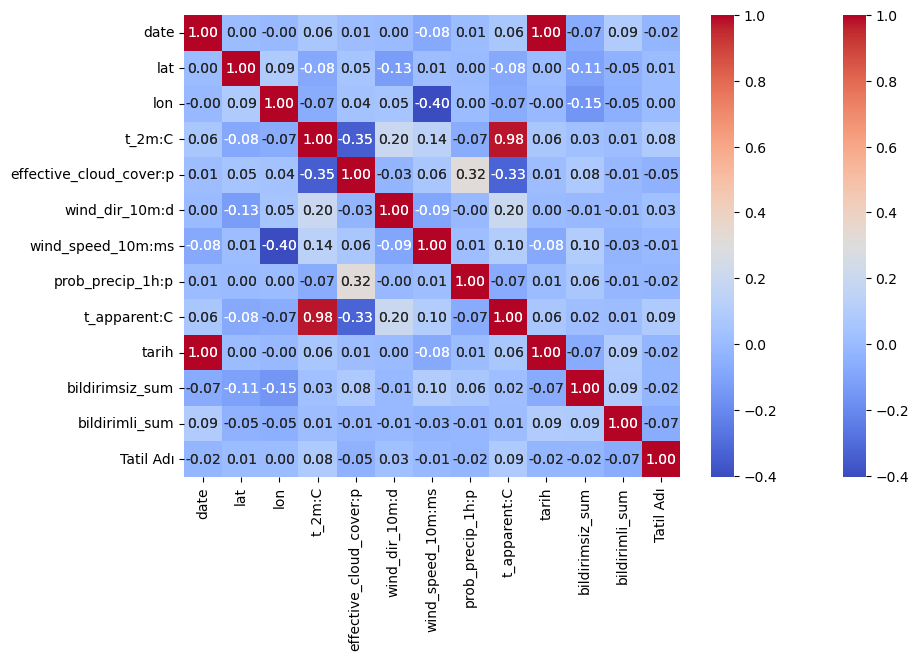

In [32]:
# Correlation heatmap
correlation = combinde_df2.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [35]:
combined_df2 = combined_df2.drop(['t_2m:C'], axis=1)
combined_df2

,date,lat,lon,effective_cloud_cover:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı
0,2021-01-05 00:00:00,38.618,28.671,88.500,134.800,2.700,1.000,8.400,2021-01-05,2.000,0.000,0.000
1,2021-01-05 01:00:00,38.618,28.671,76.200,136.800,2.800,1.000,8.100,2021-01-05,2.000,0.000,0.000
2,2021-01-05 02:00:00,38.618,28.671,74.100,135.500,3.100,1.000,8.000,2021-01-05,2.000,0.000,0.000
3,2021-01-05 03:00:00,38.618,28.671,65.300,130.600,2.700,7.600,7.900,2021-01-05,2.000,0.000,0.000
4,2021-01-05 04:00:00,38.618,28.671,45.000,138.000,3.600,12.900,8.100,2021-01-05,2.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,0.000,32.700,0.400,1.000,8.500,2024-01-31,6.000,2.000,0.000
1155548,2024-01-31 20:00:00,38.228,27.975,0.300,6.400,2.100,1.000,2.700,2024-01-31,6.000,2.000,0.000
1155549,2024-01-31 21:00:00,38.228,27.975,0.000,9.800,2.000,1.000,1.500,2024-01-31,6.000,2.000,0.000
1155550,2024-01-31 22:00:00,38.228,27.975,0.000,11.700,1.800,1.000,2.000,2024-01-31,6.000,2.000,0.000


In [36]:
combined_df2['year'] = combined_df2['date'].dt.year
combined_df2['month'] = combined_df2['date'].dt.month
combined_df2['day'] = combined_df2['date'].dt.day
combined_df2['hour'] = combined_df2['date'].dt.hour
combined_df2['weekday'] = combined_df2['date'].dt.weekday
combined_df2

,date,lat,lon,effective_cloud_cover:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,tarih,bildirimsiz_sum,bildirimli_sum,Tatil Adı,year,month,day,hour,weekday
0,2021-01-05 00:00:00,38.618,28.671,88.500,134.800,2.700,1.000,8.400,2021-01-05,2.000,0.000,0.000,2021,1,5,0,1
1,2021-01-05 01:00:00,38.618,28.671,76.200,136.800,2.800,1.000,8.100,2021-01-05,2.000,0.000,0.000,2021,1,5,1,1
2,2021-01-05 02:00:00,38.618,28.671,74.100,135.500,3.100,1.000,8.000,2021-01-05,2.000,0.000,0.000,2021,1,5,2,1
3,2021-01-05 03:00:00,38.618,28.671,65.300,130.600,2.700,7.600,7.900,2021-01-05,2.000,0.000,0.000,2021,1,5,3,1
4,2021-01-05 04:00:00,38.618,28.671,45.000,138.000,3.600,12.900,8.100,2021-01-05,2.000,0.000,0.000,2021,1,5,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,2024-01-31 19:00:00,38.228,27.975,0.000,32.700,0.400,1.000,8.500,2024-01-31,6.000,2.000,0.000,2024,1,31,19,2
1155548,2024-01-31 20:00:00,38.228,27.975,0.300,6.400,2.100,1.000,2.700,2024-01-31,6.000,2.000,0.000,2024,1,31,20,2
1155549,2024-01-31 21:00:00,38.228,27.975,0.000,9.800,2.000,1.000,1.500,2024-01-31,6.000,2.000,0.000,2024,1,31,21,2
1155550,2024-01-31 22:00:00,38.228,27.975,0.000,11.700,1.800,1.000,2.000,2024-01-31,6.000,2.000,0.000,2024,1,31,22,2


In [37]:
combined_df2.drop(['date','tarih'], axis=1, inplace=True)


In [39]:
combined_df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1155552 entries, 0 to 1155551
Data columns (total 15 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   lat                      1155552 non-null  float64
 1   lon                      1155552 non-null  float64
 2   effective_cloud_cover:p  1155552 non-null  float64
 3   wind_dir_10m:d           1155552 non-null  float64
 4   wind_speed_10m:ms        1155552 non-null  float64
 5   prob_precip_1h:p         1155552 non-null  float64
 6   t_apparent:C             1155552 non-null  float64
 7   bildirimsiz_sum          1155552 non-null  float64
 8   bildirimli_sum           1155552 non-null  float64
 9   Tatil Adı                1155552 non-null  float64
 10  year                     1155552 non-null  int32  
 11  month                    1155552 non-null  int32  
 12  day                      1155552 non-null  int32  
 13  hour                     1155552 non-null  int3

#  Feature Engineering

## Lag Features
Lag features are used to incorporate the autocorrelation of a time series into model training. In my code:

lag_1_day, lag_2_day, and lag_7_day are created as new columns in combined_df1. These represent the value of bildirimli_sum shifted by 1 day, 2 days, and 7 days, respectively. **This technique helps the model understand patterns from the previous days which may influence the prediction for the current day.**

## Rolling Window Features
Rolling window features help capture the trend and seasonality from past data:

rolling_mean_3 and rolling_mean_7 are calculated as the mean of the past 3 and 7 days of bildirimli_sum, respectively. **These features provide a smoothed version of the recent past, which can be useful to remove noise and better capture the trend of the data over the specified window size.**

In [40]:
# Creating lagged features
for lag in [1, 2, 7]:  # lag of 1 day, 2 days, and 7 days
    combined_df2[f'lag_{lag}_day'] = combined_df2['bildirimli_sum'].shift(lag)

# Creating rolling window features (rolling mean over the past 3 and 7 days)
combined_df2['rolling_mean_3'] = combined_df2['bildirimli_sum'].rolling(window=3).mean()
combined_df2['rolling_mean_7'] = combined_df2['bildirimli_sum'].rolling(window=7).mean()

# Dropping rows with NaN values created by lags and rolling features
combined_df2.dropna(inplace=True)
combined_df2

,lat,lon,effective_cloud_cover:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,bildirimsiz_sum,bildirimli_sum,Tatil Adı,year,month,day,hour,weekday,lag_1_day,lag_2_day,lag_7_day,rolling_mean_3,rolling_mean_7
7,38.618,28.671,98.000,86.000,1.400,1.000,7.600,2.000,0.000,0.000,2021,1,5,7,1,0.000,0.000,0.000,0.000,0.000
8,38.618,28.671,98.300,115.200,1.700,1.000,6.900,2.000,0.000,0.000,2021,1,5,8,1,0.000,0.000,0.000,0.000,0.000
9,38.618,28.671,56.200,147.600,2.000,1.000,7.200,2.000,0.000,0.000,2021,1,5,9,1,0.000,0.000,0.000,0.000,0.000
10,38.618,28.671,37.000,163.100,2.300,1.000,10.200,2.000,0.000,0.000,2021,1,5,10,1,0.000,0.000,0.000,0.000,0.000
11,38.618,28.671,20.200,168.300,2.200,1.000,14.100,2.000,0.000,0.000,2021,1,5,11,1,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,38.228,27.975,0.000,32.700,0.400,1.000,8.500,6.000,2.000,0.000,2024,1,31,19,2,2.000,2.000,2.000,2.000,2.000
1155548,38.228,27.975,0.300,6.400,2.100,1.000,2.700,6.000,2.000,0.000,2024,1,31,20,2,2.000,2.000,2.000,2.000,2.000
1155549,38.228,27.975,0.000,9.800,2.000,1.000,1.500,6.000,2.000,0.000,2024,1,31,21,2,2.000,2.000,2.000,2.000,2.000
1155550,38.228,27.975,0.000,11.700,1.800,1.000,2.000,6.000,2.000,0.000,2024,1,31,22,2,2.000,2.000,2.000,2.000,2.000


## Weekday encoding
This specifically categorizes days of the week into three categories using a lambda function, which is applied to each element in the weekday column:

1: This value is assigned if the day of the week is less than 5 (i.e., Monday to Thursday).<br />
2: This value is assigned if the day of the week equals 5 (i.e., Friday).<br />
3: This value is assigned if the day of the week is greater than 5 (i.e., Saturday and Sunday).<br />

The apply(lambda x: ...) function applies the given lambda function to each element in the weekday column. <br />
The condition checks within the lambda function (x < 5, x == 5, and the else condition) are used to determine which category the day falls into based on its weekday number.<br />

**This encoding used to capture any weekly cyclical patterns or behavioral differences between weekdays and weekends, which might be relevant in predictive models where day-of-week effects are significant.**


In [41]:
combined_df2['weekday_encoded'] = combined_df2['weekday'].apply(lambda x: 1 if x < 5 else (2 if x == 5 else 3))
combined_df2

,lat,lon,effective_cloud_cover:p,wind_dir_10m:d,wind_speed_10m:ms,prob_precip_1h:p,t_apparent:C,bildirimsiz_sum,bildirimli_sum,Tatil Adı,year,month,day,hour,weekday,lag_1_day,lag_2_day,lag_7_day,rolling_mean_3,rolling_mean_7,weekday_encoded
7,38.618,28.671,98.000,86.000,1.400,1.000,7.600,2.000,0.000,0.000,2021,1,5,7,1,0.000,0.000,0.000,0.000,0.000,1
8,38.618,28.671,98.300,115.200,1.700,1.000,6.900,2.000,0.000,0.000,2021,1,5,8,1,0.000,0.000,0.000,0.000,0.000,1
9,38.618,28.671,56.200,147.600,2.000,1.000,7.200,2.000,0.000,0.000,2021,1,5,9,1,0.000,0.000,0.000,0.000,0.000,1
10,38.618,28.671,37.000,163.100,2.300,1.000,10.200,2.000,0.000,0.000,2021,1,5,10,1,0.000,0.000,0.000,0.000,0.000,1
11,38.618,28.671,20.200,168.300,2.200,1.000,14.100,2.000,0.000,0.000,2021,1,5,11,1,0.000,0.000,0.000,0.000,0.000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155547,38.228,27.975,0.000,32.700,0.400,1.000,8.500,6.000,2.000,0.000,2024,1,31,19,2,2.000,2.000,2.000,2.000,2.000,1
1155548,38.228,27.975,0.300,6.400,2.100,1.000,2.700,6.000,2.000,0.000,2024,1,31,20,2,2.000,2.000,2.000,2.000,2.000,1
1155549,38.228,27.975,0.000,9.800,2.000,1.000,1.500,6.000,2.000,0.000,2024,1,31,21,2,2.000,2.000,2.000,2.000,2.000,1
1155550,38.228,27.975,0.000,11.700,1.800,1.000,2.000,6.000,2.000,0.000,2024,1,31,22,2,2.000,2.000,2.000,2.000,2.000,1


# Predictive Modeling


In [50]:
X = combined_df2.drop(columns = "bildirimsiz_sum")
y = combined_df2.bildirimsiz_sum

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3 , random_state = 42)


In [52]:
setup(combined_df2, target = "bildirimsiz_sum" ,normalize_method = "robust")

--- Logging error ---
Traceback (most recent call last):
  File "C:\Users\csume\anaconda3\Lib\logging\__init__.py", line 1113, in emit
    stream.write(msg + self.terminator)
  File "C:\Users\csume\anaconda3\Lib\encodings\cp1252.py", line 19, in encode
    return codecs.charmap_encode(input,self.errors,encoding_table)[0]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
UnicodeEncodeError: 'charmap' codec can't encode character '\u0131' in position 576: character maps to <undefined>
Call stack:
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\csume\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "C:\Users\csume\anaconda3\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
    app.start()
  File "C:\Users\csume\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 736, in start
    self.io_loop.start()
  

,Description,Value
0,Session id,1961
1,Target,bildirimsiz_sum
2,Target type,Regression
3,Original data shape,"(1155545, 21)"
4,Transformed data shape,"(1155545, 21)"
5,Transformed train set shape,"(808881, 21)"
6,Transformed test set shape,"(346664, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [53]:
compare_models()


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.3372,0.6333,0.7956,0.9785,0.1192,0.0893,135.0850
rf,Random Forest Regressor,0.4562,0.9995,0.9996,0.9660,0.1484,0.1236,189.3740
dt,Decision Tree Regressor,0.2939,2.5816,1.6063,0.9122,0.2005,0.0733,4.2630
xgboost,Extreme Gradient Boosting,2.4178,12.5173,3.5379,0.5742,0.4992,0.6613,5.3770
lightgbm,Light Gradient Boosting Machine,2.5924,14.3989,3.7945,0.5102,0.5246,0.7140,4.4340
gbr,Gradient Boosting Regressor,2.9540,20.1844,4.4926,0.3135,0.5886,0.8451,74.9000
knn,K Neighbors Regressor,3.6308,27.5210,5.2459,0.0640,0.7218,1.1021,137.0050
br,Bayesian Ridge,3.6390,27.7255,5.2654,0.0570,0.7233,1.1506,1.4270
lar,Least Angle Regression,3.6390,27.7255,5.2654,0.0570,0.7233,1.1505,0.6240
ridge,Ridge Regression,3.6390,27.7255,5.2654,0.0570,0.7233,1.1505,0.6100


ExtraTreesRegressor(n_jobs=-1, random_state=1961)